# Let's make sure that we have access to GPU

In [1]:
!nvidia-smi # Connected the runtime to 'GPU'

Invalid combination of input arguments. Please run 'nvidia-smi -h' for help.



# Install YOLOv8

In [2]:
!pip install ultralytics

'pip' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
from ultralytics import YOLO
from IPython.display import display , Image
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

ModuleNotFoundError: No module named 'ultralytics'

## Inference Example with pretrained yolov8 Model



# 💻 CLI

#####I want to test my model whether it able to detect or not

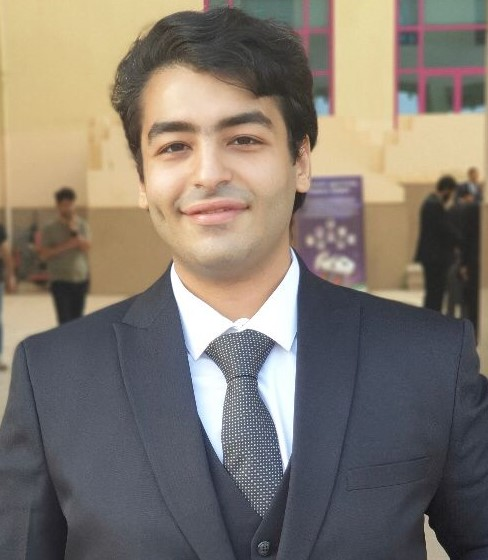

In [ ]:
Image(filename = '/content/Amr Abdelaty Fathallah.jpg' , height = 300)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt source='/content/Amr Abdelaty Fathallah.jpg' # it will download the image and the modelthen it will do the prediction

100% 6.23M/6.23M [00:00<00:00, 106MB/s]
Ultralytics YOLOv8.0.200 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/Amr Abdelaty Fathallah.jpg: 640x576 3 persons, 1 tie, 85.0ms
Speed: 14.7ms preprocess, 85.0ms inference, 271.6ms postprocess per image at shape (1, 3, 640, 576)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


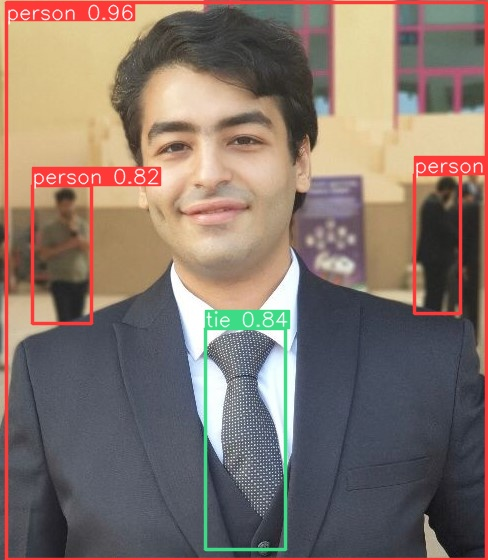

In [ ]:
Image(filename = '/content/runs/detect/predict/Amr Abdelaty Fathallah.jpg' , height = 300)

# Train YOLOv8 On Our Custom Dataset

In [ ]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninst

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="cdHbT9N7rvgK2WGChCph")
project = rf.workspace("detection-4nooy").project("drive-drowsiness-detection")
dataset = project.version(2).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.200, to fix: `pip install ultralytics==8.0.134`



Extracting Dataset Version Zip to Drive-Drowsiness-Detection-2 in yolov8:: 100%|██████████| 492/492 [00:00<00:00, 2923.89it/s]


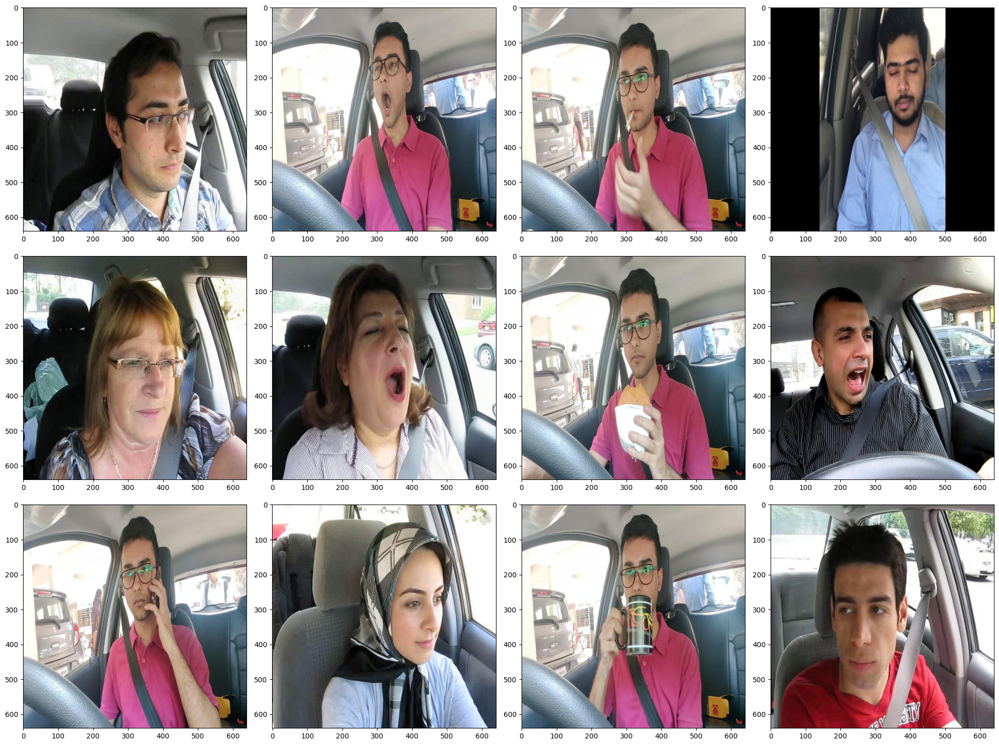

In [ ]:
import glob
from PIL import Image
import matplotlib.pyplot as plt

# Get a list of image paths
image_paths = glob.glob('/content/Drive-Drowsiness-Detection-2/train/images/*.jpg')[24:36]

# Create a figure with subplots
fig, axes = plt.subplots(3, 4, figsize=(20, 15))

# Iterate over the image paths and display images in subplots
for i, image_path in enumerate(image_paths):
    # Calculate the row and column indices of the current subplot
    row = i // 4
    col = i % 4

    # Open the image using PIL
    img = Image.open(image_path)

    # Display the image in the current subplot
    axes[row, col].imshow(img)
    # axes[row, col].axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Model 1

In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=50 imgsz=640 plots=True

100% 49.7M/49.7M [00:00<00:00, 291MB/s]
Ultralytics YOLOv8.0.200 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Drive-Drowsiness-Detection-2/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_m

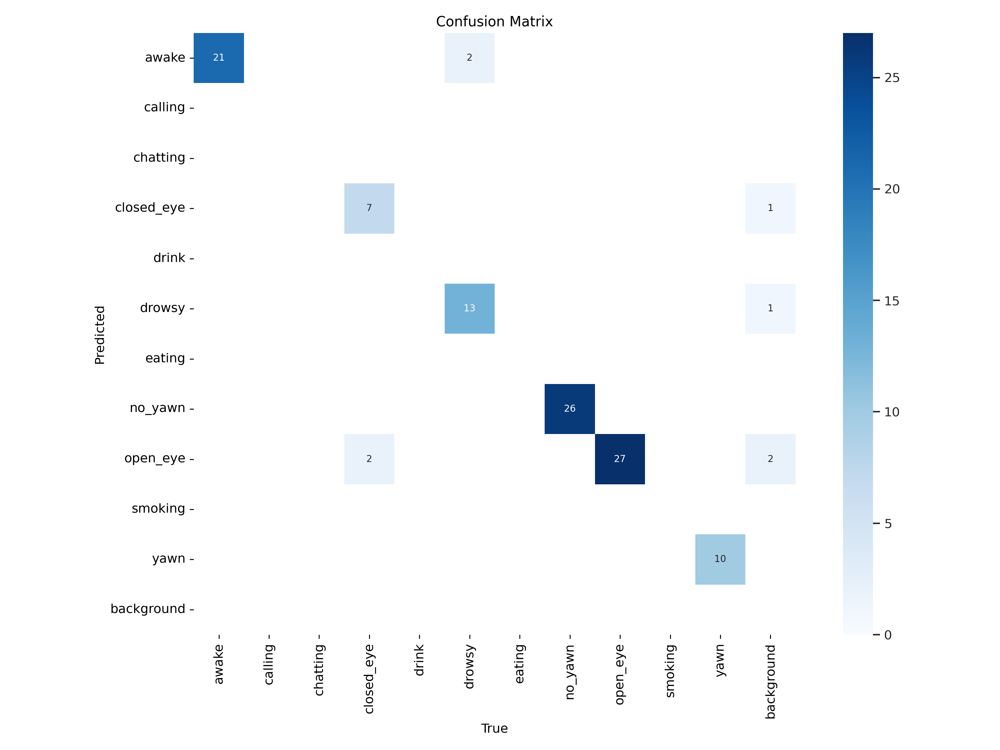

In [ ]:
Image(filename = '/content/runs/detect/train/confusion_matrix.png' , height = 600)

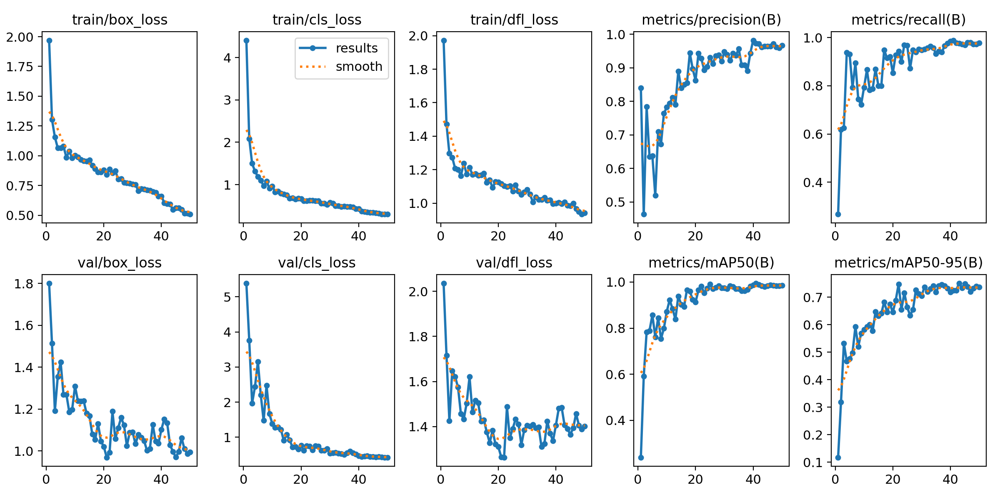

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml  # we just specify the weights that we want to validation off / passing all images through our model for validation

Ultralytics YOLOv8.0.200 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25846129 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/Drive-Drowsiness-Detection-2/valid/labels.cache... 36 images, 0 backgrounds, 0 corrupt: 100% 36/36 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:02<00:00,  1.04it/s]
                   all         36        108      0.962      0.976      0.984      0.752
                 awake         36         21      0.901          1      0.952      0.816
            closed_eye         36          9          1      0.902      0.995      0.612
                drowsy         36         15          1      0.954      0.995      0.899
               no_yawn         36         26      0.988          1      0.995      0.746
              open_eye         36         27       0.89          1       0.97      0.683
                  yawn         36 

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics YOLOv8.0.200 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25846129 parameters, 0 gradients, 78.7 GFLOPs

image 1/36 /content/Drive-Drowsiness-Detection-2/test/images/10_jpg.rf.e4696bc5b792a8821fb5a9eb8d6c81d6.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.0ms
image 2/36 /content/Drive-Drowsiness-Detection-2/test/images/132_jpg.rf.15715a998a908288272e174739b0408b.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.1ms
image 3/36 /content/Drive-Drowsiness-Detection-2/test/images/139_jpg.rf.3cffeb3e581e086f7f1b6658d35b86e7.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.0ms
image 4/36 /content/Drive-Drowsiness-Detection-2/test/images/13_jpg.rf.e83ea0fa9f9d90ac13b063c899371095.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.0ms
image 5/36 /content/Drive-Drowsiness-Detection-2/test/images/144_jpg.rf.3393fc5c57f38e8704703048449d143f.jpg: 640x640 1 closed_eye, 1 drowsy, 1 yawn, 29.1ms
image 6/36 /content/Drive-Drowsiness-Detection-2/test/i

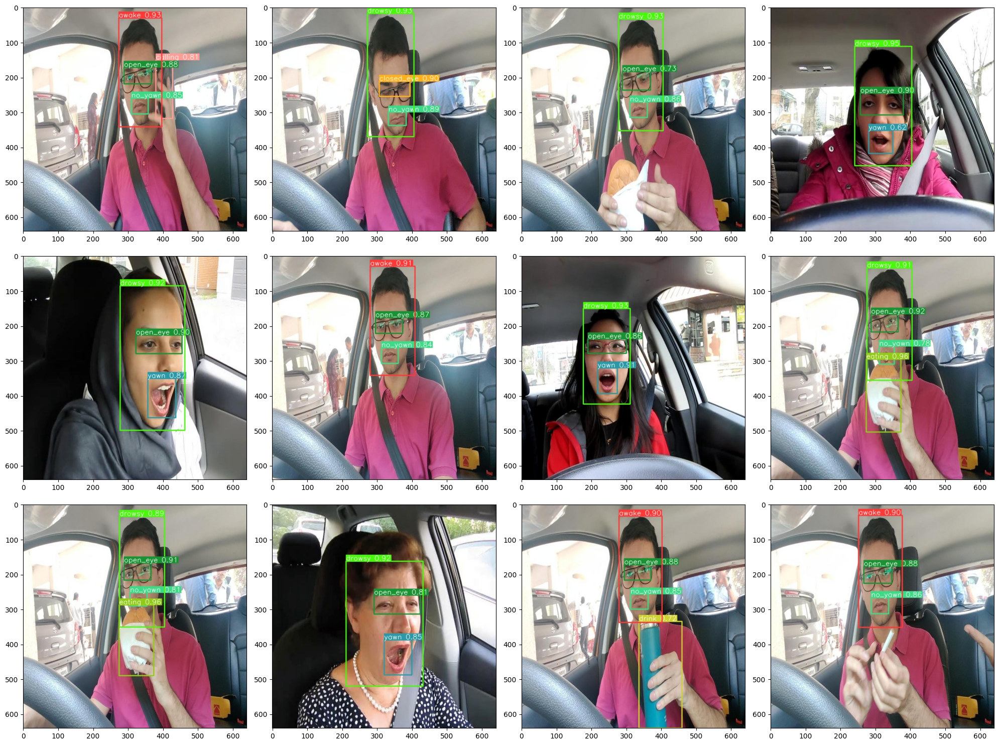

In [ ]:
import glob
from PIL import Image
import matplotlib.pyplot as plt

# Get a list of image paths
image_paths = glob.glob('/content/runs/detect/predict3/*.jpg')[-12:]

# Create a figure with subplots
fig, axes = plt.subplots(3, 4, figsize=(20, 15))

# Iterate over the image paths and display images in subplots
for i, image_path in enumerate(image_paths):
    # Calculate the row and column indices of the current subplot
    row = i // 4
    col = i % 4

    # Open the image using PIL
    img = Image.open(image_path)

    # Display the image in the current subplot
    axes[row, col].imshow(img)
    # axes[row, col].axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Model 2

In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=100 imgsz=640 plots=True

Ultralytics YOLOv8.0.200 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Drive-Drowsiness-Detection-2/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchsc

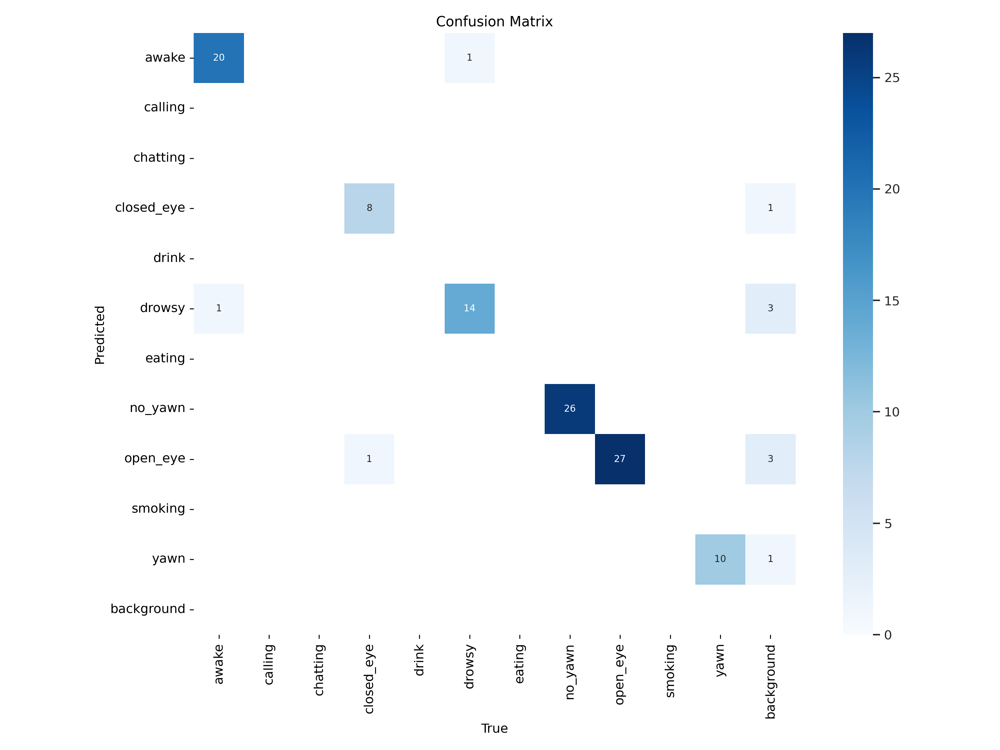

In [ ]:
Image(filename = '/content/runs/detect/train2/confusion_matrix.png' , height = 600)

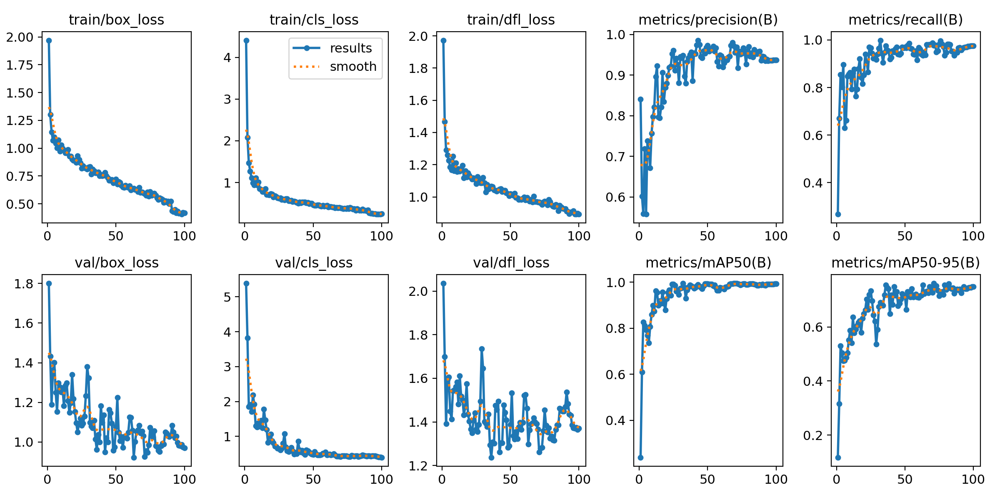

In [ ]:
Image(filename=f'/content/runs/detect/train2/results.png', width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train2/weights/best.pt data={dataset.location}/data.yaml  # we just specify the weights that we want to validation off / passing all images through our model for validation

Ultralytics YOLOv8.0.200 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25846129 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/Drive-Drowsiness-Detection-2/valid/labels.cache... 36 images, 0 backgrounds, 0 corrupt: 100% 36/36 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:03<00:00,  1.06s/it]
                   all         36        108      0.969      0.977      0.994      0.762
                 awake         36         21      0.999      0.952      0.993      0.868
            closed_eye         36          9          1      0.977      0.995      0.562
                drowsy         36         15       0.89          1      0.991       0.93
               no_yawn         36         26          1      0.935      0.995      0.765
              open_eye         36         27       0.99          1      0.995      0.681
                  yawn         36 

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics YOLOv8.0.200 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25846129 parameters, 0 gradients, 78.7 GFLOPs

image 1/36 /content/Drive-Drowsiness-Detection-2/test/images/10_jpg.rf.e4696bc5b792a8821fb5a9eb8d6c81d6.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.0ms
image 2/36 /content/Drive-Drowsiness-Detection-2/test/images/132_jpg.rf.15715a998a908288272e174739b0408b.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.1ms
image 3/36 /content/Drive-Drowsiness-Detection-2/test/images/139_jpg.rf.3cffeb3e581e086f7f1b6658d35b86e7.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.0ms
image 4/36 /content/Drive-Drowsiness-Detection-2/test/images/13_jpg.rf.e83ea0fa9f9d90ac13b063c899371095.jpg: 640x640 1 drowsy, 1 open_eye, 1 yawn, 37.1ms
image 5/36 /content/Drive-Drowsiness-Detection-2/test/images/144_jpg.rf.3393fc5c57f38e8704703048449d143f.jpg: 640x640 2 closed_eyes, 1 drowsy, 28.5ms
image 6/36 /content/Drive-Drowsiness-Detection-2/test/images/1

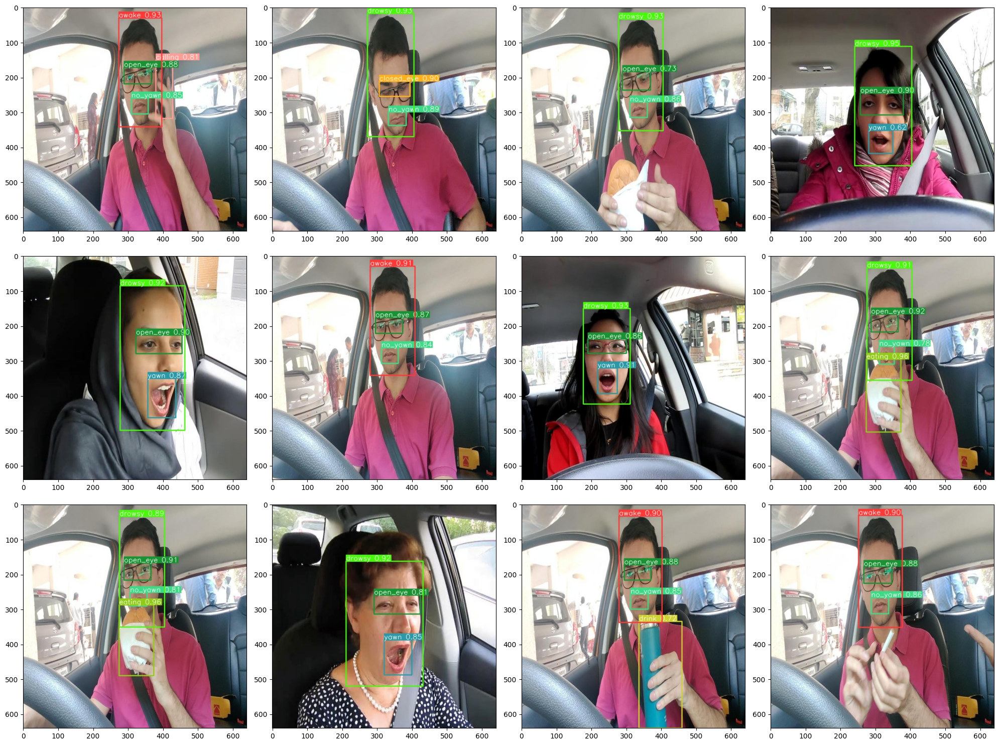

In [ ]:
import glob
from PIL import Image
import matplotlib.pyplot as plt

# Get a list of image paths
image_paths = glob.glob('/content/runs/detect/predict3/*.jpg')[-12:]

# Create a figure with subplots
fig, axes = plt.subplots(3, 4, figsize=(20, 15))

# Iterate over the image paths and display images in subplots
for i, image_path in enumerate(image_paths):
    # Calculate the row and column indices of the current subplot
    row = i // 4
    col = i % 4

    # Open the image using PIL
    img = Image.open(image_path)

    # Display the image in the current subplot
    axes[row, col].imshow(img)
    # axes[row, col].axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()